In [ ]:
NOT USED
import bz2 
import tarfile
import json
import os.path
import sys
import pandas as pd
import numpy as np
from nltk import tokenize

#filepath='/home/augustine/Documents/reddit_project/RC_2017-05.bz2' #name the file
#zipfile = bz2.BZ2File(filepath) # open the file
#data = zipfile.read() # get the decompressed data
#dicts= json.loads(data)

archive = '/home/augustine/Documents/reddit_project/RC_2017-05.bz2'
bz_file = bz2.BZ2File(archive, 'rb', 1000000)
#r/IAmA
#r/Technology
commentCount= []
while true:
    line = bz_file.readline().decode('utf8')
    if len(line)==0 :
        break
    comment=json.loads(line)
    id= comment['id']
    body= comment['body']
    
    comentLines= tokenize.sent_tokenize(body)
    for line in commentLines:
        line = line.replace('\n', ' ').replace('\r', '')
        print(line)
        
    commentCount += 1
    
    if commentCount % 1000 == 0:
        print(commentCount)
    
bz_file.close()


#newfilepath = filepath[:-4] # assuming the filepath ends with .bz2
#open(newfilepath, 'wb').write(data) # write a uncompressed file

#tar= tarfile.open(filename,'r')

#txt=bz2File.

#df= pd.read_csv('/home/augustine/Documents/reddit_project/RC_2017-05.bz2',compression='bz2',header=0,sep=',')

I want to open one record and load it just to see what the JSON and loaded version looks like

In [6]:
import bz2 
import json
#saved on a windows drive
archive= 'C:\\users\Augustine\Documents\\reddit\RC_2017-05.bz2'
#saved on a linux drive
#archive = '/home/augustine/Documents/reddit/RC_2017-05.bz2'
with bz2.open(archive,'rt') as f:
    for comment in f:
        print(comment)
        parse_comment= json.loads(comment)
        print(parse_comment)
        print(parse_comment['subreddit'],parse_comment['body'])
        break

{"author":"varvar1n","author_flair_css_class":null,"author_flair_text":null,"body":"Ich muss leider feststellen, dass das einzige, was wirklich zur DE Leitkultur geh\u00f6rt, die Peinlichkeit Stakkato von jedem Innenminister ist. Da macht der Tommy auch brav mit. Und ich schreibe seit 2015 wie immer wenn ich \u00fcber Tommy schreibe den Hashtag #immernochinamt Es ist ein Wunder, wie er so viele Pannen \u00fcberstanden hat und den Absurd weiter und h\u00f6her getrieben hat. ","can_gild":true,"controversiality":0,"created_utc":1493596800,"distinguished":null,"edited":false,"gilded":0,"id":"dgyrubd","link_id":"t3_68gcih","parent_id":"t3_68gcih","retrieved_on":1494514468,"score":4,"stickied":false,"subreddit":"de","subreddit_id":"t5_22i0"}

{'author': 'varvar1n', 'author_flair_css_class': None, 'author_flair_text': None, 'body': 'Ich muss leider feststellen, dass das einzige, was wirklich zur DE Leitkultur gehört, die Peinlichkeit Stakkato von jedem Innenminister ist. Da macht der Tommy au

Now which subreddit is this record from?

In [4]:
#parse_comment.keys()
parse_comment['subreddit']



'de'

How many total records are in the file we downloaded?

In [7]:
#total records in 5/2017 comment file
#archive = '/home/augustine/Documents/reddit_project/RC_2017-05.bz2'
with bz2.open(archive,'rt') as f:
    for count, record in enumerate(f):
        pass
    print(count)

79810359


79.8M comments! That seems like a good amount of data to choose from.

Let's take a look at some of the subreddits and their number of comments.


In [23]:
counter

Counter({'de': 132208,
         'AskReddit': 5477134,
         'xxfitness': 30130,
         'politics': 2030218,
         'aww': 226784,
         'movies': 397599,
         'gaming': 464367,
         'kulchasimulator': 7239,
         'The_Donald': 1222203,
         'hardwareswap': 62808,
         'CCW': 19810,
         'autism': 3479,
         'soccer': 572163,
         'starbucks': 19523,
         'funhaus': 13721,
         'DnD': 114850,
         'hockey': 636822,
         'Cartalk': 5205,
         'AskMen': 134975,
         'hentai': 3783,
         'relationships': 304513,
         'SquaredCircle': 524949,
         'starcraft': 28522,
         'MMA': 252268,
         'StardustCrusaders': 17944,
         'smashbros': 62463,
         'allthingszerg': 1343,
         'cringepics': 34016,
         'trees': 147136,
         'orlando': 5572,
         'ApplyingToCollege': 17820,
         'PoliticalHumor': 70862,
         'AFL': 75575,
         'Warthunder': 52977,
         'TrueReddit': 187

In [8]:
import collections 
archive= 'C:\\users\Augustine\Documents\\reddit\RC_2017-05.bz2'
#archive = '/home/augustine/Documents/reddit_project/RC_2017-05.bz2'
with bz2.open(archive,'rt') as f:
    counter= collections.Counter(json.loads(comment)['subreddit'] for comment in f)







Now I'm hoping this is working. Let's see if we can specify a subreddit and look at one record. 

In [14]:
#take a look at one record
#\
#archive = '/home/augustine/Documents/reddit_project/RC_2017-05.bz2'
with bz2.open(archive,'rt') as f:
    for comment in f:
        if json.loads(comment)['subreddit']=='technology':
            line= json.loads(comment)
            print(line)
            break
            #comment= json.loads(comment)['body']  
    #for text in comment:
        #print(text)
        #break
 #       print(comment)
 #       break
 #       body= comment['body']
 #       my_id= comment['id']
 #       created_utc= comment['created_utc']
 #       parent_id=comment['parent_id']
 #       score= comment['score']
        
    
#    for text in myTech:
#        print(text)
    


{'author': 'TittieMilkTittieMilk', 'author_flair_css_class': None, 'author_flair_text': None, 'body': "Wait, you can get HBO for just a couple months? You don't have to sign a contract for a year? We switched from HBO to Starz and now I'm beyond regretful... I just want it for a few months to watch Game of Thrones.", 'can_gild': True, 'controversiality': 0, 'created_utc': 1493596827, 'distinguished': None, 'edited': False, 'gilded': 0, 'id': 'dgyrv10', 'link_id': 't3_68g6e7', 'parent_id': 't1_dgym9lv', 'retrieved_on': 1494514478, 'score': 11, 'stickied': False, 'subreddit': 'technology', 'subreddit_id': 't5_2qh16'}


This next step takes a long time to run.  I'm going to use bz2 again.  To arrange the data in the format I want, I created empty arrays for each field in the JSON file and then loaded the file into a 2D-Array.

I ran for one subreddit (I picked soccer because I enjoy soccer) but we can load all of the subreddits into a list
and then loop through the list to load all subreddits into a dataframe.

In [6]:
import pandas as pd

#archive = '/home/augustine/Documents/reddit_project/RC_2017-05.bz2'
commentCount= 0

author=[]
author_flair_css_class= []
author_flair_text= []
body= []
can_gild= []
controversiality= []
created_utc= []
distinguished= []
edited= []
gilded= []
id= []
link_id= []
parent_id= []
retrieved_on= []
score= []
stickied= []
subreddit= []
subreddit_id= []

line_all= []
with bz2.open(archive,'rt') as f:
    comment= [json.loads(comment) for comment in f if json.loads(comment)['subreddit']=='technology']
    #for comment in f:
        #if json.loads(comment)['subreddit']=='technology':
        #line= json.loads(comment)
    #line_all += comment.values()
    line_all= line_all.append(comment)
    
    commentCount += 1
    if commentCount % 1000000 == 0:
        print(commentCount)


In [10]:
#step 1

import pandas as pd
import json
import bz2 

pd.set_option('display.max_columns',None)#b/c i want to see all columns


#archive = '/home/augustine/Documents/reddit_project/RC_2017-05.bz2'
archive= 'C:\\users\Augustine\Documents\\reddit\RC_2017-05.bz2'
line_all= []
with bz2.open(archive,'rt') as f:
    my_row= []
    for comment in f:
        if json.loads(comment)['subreddit']=='soccer':
            comment= json.loads(comment) 
            my_row.append(comment)
    line_all.append(my_row)
    #for comment in f:
        #if json.loads(comment)['subreddit']=='technology':
        #line= json.loads(comment)
    #line_all += comment.values()
    #line_all= line_all.append(comment)


In [22]:
line_all[0][1]['author']

'Thesolly180'

Now I'm going to create lists for each field in the JSON string.  My goal is to create a pandas dataframe.

In [11]:
#step 2
author=[]
author_flair_css_class= []
author_flair_text= []
body= []
can_gild= []
controversiality= []
created_utc= []
distinguished= []
edited= []
gilded= []
id= []
link_id= []
parent_id= []
retrieved_on= []
score= []
stickied= []
subreddit= []
subreddit_id= []


for i in range(0, len(line_all[0])):
    author.append(line_all[0][i]['author'])
    author_flair_css_class.append(line_all[0][i]['author_flair_css_class'])
    author_flair_text.append(line_all[0][i]['author_flair_text'])
    body.append(line_all[0][i]['body'])
    can_gild.append(line_all[0][i]['can_gild'])
    controversiality.append(line_all[0][i]['controversiality'])
    created_utc.append(line_all[0][i]['created_utc'])
    distinguished.append(line_all[0][i]['distinguished'])
    edited.append(line_all[0][i]['edited'])
    gilded.append(line_all[0][i]['gilded'])
    id.append(line_all[0][i]['id'])
    link_id.append(line_all[0][i]['link_id'])
    parent_id.append(line_all[0][i]['parent_id'])
    retrieved_on.append(line_all[0][i]['retrieved_on'])
    score.append(line_all[0][i]['score'])
    stickied.append(line_all[0][i]['stickied'])
    subreddit.append(line_all[0][i]['subreddit'])
    subreddit_id.append(line_all[0][i]['subreddit_id'])

    

I want to check the lenght of my subreddit list

In [12]:
#step 3 check the length matches earlier
#line_all[1][]['line']['body']
len(line_all[0])

572163

Finally, load the lists as a dataframe.

In [13]:
#step 4
import numpy as np
from pandas import Series, DataFrame
import pandas as pd

subr_df= DataFrame({'author':author,
                   'author_flair_css_class':author_flair_css_class,
                   'author_flair_text':author_flair_text,
                   'body':body,
                   'can_gild':can_gild,
                   'controversiality':controversiality,
                   'created_utc':created_utc,
                   'distinguished':distinguished,
                   'edited':edited,
                   'gilded':gilded,
                   'id':id,
                   'link_id':link_id,
                   'parent_id':parent_id,
                   'retrieved_on':retrieved_on,
                   'score':score,
                   'stickied':stickied,
                   'subreddit':subreddit,
                   'subreddit_id':subreddit_id})

subr_df= subr_df[['author', 'author_flair_css_class','author_flair_text','body','can_gild','controversiality',
                   'created_utc','distinguished','edited','gilded','id','link_id','parent_id','retrieved_on',
                   'score','stickied','subreddit','subreddit_id']]

In [14]:
#take a look at the df
subr_df.head()

,author,author_flair_css_class,author_flair_text,body,can_gild,controversiality,created_utc,distinguished,edited,gilded,id,link_id,parent_id,retrieved_on,score,stickied,subreddit,subreddit_id
0,iEatPorcupines,None,None,"After seeing [this,](https://my.mixtape.moe/ro...",True,0,1493596800,None,False,0,dgyrubq,t3_689pik,t1_dgxxk64,1494514468,2,False,soccer,t5_2qi58
1,Thesolly180,s1 3 team-3 country-eng,Liverpool,"Didn't say I'd never heard of it, where did I ...",True,0,1493596818,None,False,0,dgyrurw,t3_68gfcq,t1_dgypb4q,1494514474,0,False,soccer,t5_2qi58
2,ntdxc1878,s1 15 team-15 country-eng,Everton,What's the context?,True,0,1493596822,None,False,0,dgyruwl,t3_68gmp0,t1_dgyk59x,1494514476,2,False,soccer,t5_2qi58
3,iEatPorcupines,None,None,Just show him [this.](https://my.mixtape.moe/r...,True,0,1493596823,None,False,0,dgyruxj,t3_689pik,t1_dgxxy6e,1494514477,1,False,soccer,t5_2qi58
4,[deleted],None,None,[deleted],True,0,1493596826,None,False,0,dgyrv0j,t3_68ib88,t1_dgyrsrf,1494514478,-32,False,soccer,t5_2qi58


One thing I'll do for easier processing is convert the field create_utc to a python datetime datatype.

In [15]:
from datetime import datetime
subr_df['created_datetime'] = subr_df.created_utc.apply(datetime.utcfromtimestamp)
subr_df['created_year'] = subr_df.created_datetime.dt.year
subr_df['created_month'] = subr_df.created_datetime.dt.month
subr_df['created_day'] = subr_df.created_datetime.dt.day
subr_df['created_hour'] = subr_df.created_datetime.dt.hour


#step 6
#change the epoch time to python datetime
#subr_df['created_datetime']= pd.to_datetime((subr_df['created_utc'].values*1e9).astype(int))

In [100]:
#step 7
#inspect new datetime format
subr_df.head()

,author,author_flair_css_class,author_flair_text,body,can_gild,controversiality,created_utc,distinguished,edited,gilded,...,score,stickied,subreddit,subreddit_id,created_datetime,hour,created_hour,created_day,created_year,created_month
0,iEatPorcupines,None,None,"After seeing [this,](https://my.mixtape.moe/ro...",True,0,1493596800,None,False,0,...,2,False,soccer,t5_2qi58,2017-05-01 00:00:00,0,0,1,2017,5
1,Thesolly180,s1 3 team-3 country-eng,Liverpool,"Didn't say I'd never heard of it, where did I ...",True,0,1493596818,None,False,0,...,0,False,soccer,t5_2qi58,2017-05-01 00:00:18,0,0,1,2017,5
2,ntdxc1878,s1 15 team-15 country-eng,Everton,What's the context?,True,0,1493596822,None,False,0,...,2,False,soccer,t5_2qi58,2017-05-01 00:00:22,0,0,1,2017,5
3,iEatPorcupines,None,None,Just show him [this.](https://my.mixtape.moe/r...,True,0,1493596823,None,False,0,...,1,False,soccer,t5_2qi58,2017-05-01 00:00:23,0,0,1,2017,5
4,[deleted],None,None,[deleted],True,0,1493596826,None,False,0,...,-32,False,soccer,t5_2qi58,2017-05-01 00:00:26,0,0,1,2017,5


In [31]:
subr_df['author'].notnull().sum()

572163

In [40]:
subr_df['author_flair_css_class'].notnull().sum()

#tech_df['author_flair_css_class'].value_counts()


451968

In [41]:
subr_df['author_flair_text'].notnull().sum()
#tech_df['author_flair_text'].value_counts()

451968

In [42]:
subr_df['controversiality'].value_counts()

0    545603
1     26560
Name: controversiality, dtype: int64

In [43]:
subr_df['controversiality'].value_counts()/tech_df['controversiality'].notnull().sum()

0    0.95358
1    0.04642
Name: controversiality, dtype: float64

In [44]:
subr_df['parent_id'].value_counts()

t3_6dohmw     4829
t3_6d3qhb     3752
t3_6aepqu     3291
t3_68unrk     2524
t3_691y2x     1906
t3_6a7031     1452
t3_69rg3o     1334
t3_6e05f9     1245
t3_699lpt     1205
t3_6alxyf     1148
t3_6am7lk     1129
t3_691azc     1049
t3_6b45nz      866
t3_6aswsf      826
t3_6b3spj      757
t3_68o8zb      742
t3_69gbs5      719
t3_6bqe2b      713
t3_6axcik      693
t3_68nuv8      659
t3_6cgjal      640
t3_6d4uq6      582
t3_6ayq1k      579
t3_6cmxyc      561
t3_6atxjn      556
t3_69ztbb      522
t3_6bj44m      518
t3_69r1mr      503
t3_6bc8uv      491
t3_69knd6      488
              ... 
t1_dhszzfb       1
t1_dh7syx9       1
t1_dh2zwz9       1
t1_di69c2n       1
t1_dhdiuxk       1
t1_di2i19i       1
t1_dia24iw       1
t1_dhriusb       1
t3_6e5ka6        1
t1_dh9c0ao       1
t1_dhl3sll       1
t1_dhrlgqn       1
t1_dhh0n9z       1
t1_di4jfx4       1
t1_dhe3o5j       1
t1_dhox0rf       1
t1_di1iwv3       1
t1_dh16d7y       1
t1_dhxok3a       1
t1_dhw539f       1
t1_dhjl3wj       1
t1_dhutkb7  

In [45]:
subr_df['parent_id'].value_counts().unique()

array([4829, 3752, 3291, 2524, 1906, 1452, 1334, 1245, 1205, 1148, 1129,
       1049,  866,  826,  757,  742,  719,  713,  693,  659,  640,  582,
        579,  561,  556,  522,  518,  503,  491,  488,  478,  452,  449,
        416,  410,  406,  398,  388,  384,  379,  372,  371,  328,  306,
        300,  298,  283,  277,  275,  270,  267,  266,  264,  263,  262,
        258,  257,  253,  251,  249,  247,  240,  238,  236,  233,  231,
        230,  218,  217,  216,  215,  214,  212,  210,  209,  206,  202,
        201,  200,  199,  197,  195,  188,  185,  179,  177,  175,  174,
        170,  167,  165,  164,  161,  159,  158,  157,  156,  155,  154,
        151,  150,  149,  148,  147,  146,  143,  142,  140,  139,  138,
        136,  135,  134,  133,  131,  129,  128,  127,  126,  125,  124,
        122,  121,  118,  117,  116,  115,  114,  113,  112,  110,  109,
        106,  105,  104,  103,  101,  100,   99,   98,   97,   96,   95,
         94,   93,   92,   89,   88,   87,   86,   

In [46]:
subr_df['author'].describe()

count        572163
unique        44846
top       [deleted]
freq          37745
Name: author, dtype: object

In [47]:
subr_df['score'].describe()

count    572163.000000
mean         13.210465
std          69.942649
min        -610.000000
25%           1.000000
50%           2.000000
75%           8.000000
max       10818.000000
Name: score, dtype: float64

In [48]:
subr_df['body'].describe()

count        572163
unique       519994
top       [deleted]
freq          31760
Name: body, dtype: object

In [16]:
#create an 'hour' feature so we can graph posts by hour of day
subr_df['hour']=subr_df.created_datetime.dt.hour

In [92]:
subr_df.head()

,author,author_flair_css_class,author_flair_text,body,can_gild,controversiality,created_utc,distinguished,edited,gilded,id,link_id,parent_id,retrieved_on,score,stickied,subreddit,subreddit_id,created_datetime,hour
0,iEatPorcupines,None,None,"After seeing [this,](https://my.mixtape.moe/ro...",True,0,1493596800,None,False,0,dgyrubq,t3_689pik,t1_dgxxk64,1494514468,2,False,soccer,t5_2qi58,2017-05-01 00:00:00,0
1,Thesolly180,s1 3 team-3 country-eng,Liverpool,"Didn't say I'd never heard of it, where did I ...",True,0,1493596818,None,False,0,dgyrurw,t3_68gfcq,t1_dgypb4q,1494514474,0,False,soccer,t5_2qi58,2017-05-01 00:00:18,0
2,ntdxc1878,s1 15 team-15 country-eng,Everton,What's the context?,True,0,1493596822,None,False,0,dgyruwl,t3_68gmp0,t1_dgyk59x,1494514476,2,False,soccer,t5_2qi58,2017-05-01 00:00:22,0
3,iEatPorcupines,None,None,Just show him [this.](https://my.mixtape.moe/r...,True,0,1493596823,None,False,0,dgyruxj,t3_689pik,t1_dgxxy6e,1494514477,1,False,soccer,t5_2qi58,2017-05-01 00:00:23,0
4,[deleted],None,None,[deleted],True,0,1493596826,None,False,0,dgyrv0j,t3_68ib88,t1_dgyrsrf,1494514478,-32,False,soccer,t5_2qi58,2017-05-01 00:00:26,0


In [17]:
#count comments during the month by time
time_counts=subr_df.created_datetime.value_counts()
time_countsDf=time_counts.to_frame()
#time_countsDf.rename(columns=)
time_countsDf.rename(columns={'time':'comments'},inplace=True)

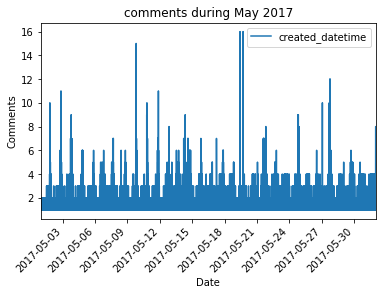

In [18]:
#now graph the number of comments during the month by time

#plot comments by hour of the day
import matplotlib.pyplot as plt
%matplotlib inline

time_countsDf.plot(kind='line',title= 'comments during May 2017')
plt.xticks(rotation=45)
plt.xlabel('Date')
plt.ylabel('Comments')
plt.show()


Let's look at comments by day/ time in a couple of different ways.
First let's group comments into day of the month

In [19]:
#import datetime
#count comments during the month by date
#reformat created_utc to day
#subr_df['created_date']=subr_df['created_datetime'].dt.day
day_counts=subr_df.created_day.value_counts().sort_index()
day_countsDf= day_counts.to_frame()
#time_countsDf.rename(columns=)
day_countsDf.rename(columns={'time':'comments'},inplace=True)
#day_countsDf.sort_values(by='index')

In [104]:
day_countsDf

,created_day
1,14886
2,20602
3,20739
4,15555
5,15136
6,18687
7,21655
8,13829
9,18339
10,19783


In [ ]:
#plot comments by hour of the day
import matplotlib.pyplot as plt
%matplotlib inline

day_countsDf.plot(kind='line',title= 'comments by day during May 2017')
plt.xticks(rotation=45)
plt.xlabel('Date')
plt.ylabel('Comments')
plt.show()


Next look at hour of the day.  Earlier we created an hour feature based on our 'created_datetime' field.

In [20]:
#count comments by hour(1-24) of the day
hour_counts=subr_df.hour.value_counts().sort_index()
unique_hours=subr_df.hour.unique()
hour_countsDf= hour_counts.to_frame()
#unique_hoursDf= unique_hours.to_frame()
hour_countsDf.rename(columns={'hour':'comments'},inplace=True)
#print(hour_counts)
#print(unique_hours)

In [108]:
hour_counts

0     12957
1     10412
2      8534
3      7095
4      6278
5      6055
6      7028
7      8706
8     10494
9     12839
10    14966
11    19551
12    26164
13    29866
14    35742
15    37758
16    39300
17    36471
18    43573
19    59062
20    61083
21    37238
22    23717
23    17274
Name: hour, dtype: int64

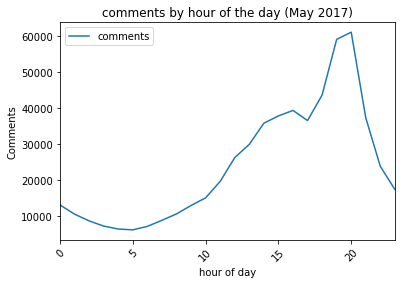

In [21]:
#plot comments by hour of the day
import matplotlib.pyplot as plt
%matplotlib inline

hour_countsDf.plot(kind='line',title= 'comments by hour of the day (May 2017)')
plt.xticks(rotation=45)
plt.xlabel('hour of day')
plt.ylabel('Comments')
plt.show()


It looks like comment volume peaks at hour 20 or 8 pm.  

I just want to use parent level comments.  Parent level comments should have t3 in the 'parent_id' field.
I'm going to use a simple regular expression to subset the dataframe so I just have parent level comments.

Building a commnet tree requires parsing up the parent_id field until your reach a parent_id beginning with 't3'.

In [22]:
import re 
par_subr_df=subr_df[subr_df.parent_id.str.contains('t3_',regex=True)]


I also want to drop comments that were deleted.

In [23]:
#remove obeservations where the body/comment was deleted
del_par_subr_df= par_subr_df.loc[(par_subr_df['body']!='[deleted]')]

I am going to save the final dataframe using pickle.

In [ ]:
#save the datframe to disk using pickle
del_par_subr_df.to_pickle('C:\\users\\Augustine\\documents\\reddit\\subr_soccer_201705.pkl')

# reimport pandas and read in pickle
#import pandas as pd
#read the df if needed.
#tech_df= pd.read_pickle('/home/augustine/Documents/reddit_project/subr_technology_201705.pkl')

In [133]:
pd.set_option('display.max_columns',None)
print(subr_df[:1])

        author author_flair_css_class author_flair_text  \
58790  RCFProd                   None              None   

                                                    body can_gild  \
58790  I just read this comment 5 months later and ne...     True   

       controversiality  created_utc distinguished edited  gilded       id  \
58790                 0   1493889914          None  False       0  dh44knl   

         link_id   parent_id  retrieved_on  score stickied subreddit  \
58790  t3_5cadem  t1_d9v92m8    1496247396      1    False    soccer   

      subreddit_id    created_datetime  hour  created_hour  created_day  \
58790     t5_2qi58 2017-05-04 09:25:14     9             9            4   

       created_year  created_month  
58790          2017              5  


In [2]:
#split and load parts of parent id to 't_' and '_id'
tech_df['t_'],tech_df['_id']=tech_df['parent_id'].str.split("_",1).str
#find parent_id of comment parent
idParent_dict= tech_df.set_index('id')['_id'].to_dict()
tech_df['parent_1']=tech_df['_id'].map(idParent_dict)

In [87]:
#step by step walkthrough
#loop through the data frame, by parentId group,
#create dictionary to recursively match parent and child in thread
print(tech_df['id'].describe(),'\n')



print(tech_df['parent_id'].describe(),'\n')
#split and load parts of parent id to 't_' and '_id'
#tech_df['t_'],tech_df['_id']=tech_df['parent_id'].str.split("_",1).str

#idParent_dict= tech_df.set_index('id')['_id'].to_dict()

#find parent_id of comment parent
tech_df['parent_1']=tech_df['_id'].map(idParent_dict)

print(tech_df['parent_1'].describe(),'\n')

#do the same thing on parent_1
#tech_df['parent_2']=tech_df['parent_1'].map(linkParent_dict)
print(tech_df['parent_2'].describe(),'\n')

#do the same thing on parent_2
#tech_df['parent_3']=tech_df['parent_2'].map(linkParent_dict)
print(tech_df['parent_3'].describe(),'\n')
#tech_df[parent_id]
#tech_df.sort().group_by()
#def 

count      139136
unique     139136
top       di8i4n2
freq            1
Name: id, dtype: object 

count        139136
unique        68955
top       t3_6cvg82
freq            942
Name: parent_id, dtype: object 

count     108321
unique     39310
top       6bytpx
freq         776
Name: parent_1, dtype: object 

count         10062
unique         6185
top       t3_6c27c1
freq            406
Name: parent_2, dtype: object 

count         10062
unique         6185
top       t3_6c27c1
freq            406
Name: parent_3, dtype: object 



In [4]:
#remove obeservations where the body/comment was deleted
techT1Del_df= techT1_df.loc[(techT1_df['body']!='[deleted]')]
#techT1Del_df.reset_index(inplace=True)
#techT1Del_df.set_index('index',inplace=True)

In [153]:
del_par_subr_df['parent_id'].describe()

count        155254
unique        10587
top       t3_6dohmw
freq           4472
Name: parent_id, dtype: object

In [154]:
del_par_subr_df['score'].describe()

count    155254.000000
mean         19.221482
std         110.013798
min        -220.000000
25%           1.000000
50%           2.000000
75%           8.000000
max       10818.000000
Name: score, dtype: float64

In [169]:
from nltk.corpus import stopwords
from nltk.stem.wordnet import WordNetLemmatizer
import string
stop = set(stopwords.words('english'))
exclude = set(string.punctuation)
lemma = WordNetLemmatizer()
def clean(doc):
    stop_free = " ".join([i for i in doc.lower().split() if i not in stop])
    punc_free = ''.join(ch for ch in stop_free if ch not in exclude)
    normalized = " ".join(lemma.lemmatize(word) for word in punc_free.split())
    return normalized

doc_clean = [clean(doc).split() for doc in doc_complete]       

In [182]:
import gensim
from gensim import corpora

dictionary = corpora.Dictionary(doc_clean)
doc_term_matrix = [dictionary.doc2bow(doc) for doc in doc_clean]

C:\Users\Augustine\Anaconda3\lib\site-packages\gensim\utils.py:860: UserWarning: detected Windows; aliasing chunkize to chunkize_serial
  warnings.warn("detected Windows; aliasing chunkize to chunkize_serial")


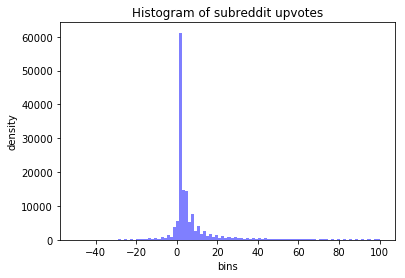

In [301]:
import numpy as np
import matplotlib.mlab as mlab
import matplotlib.pyplot as plt
 
x = del_par_subr_df['score']
num_bins = 100
n, bins, patches = plt.hist(x,num_bins, range=[-50,100], facecolor='blue', alpha=0.5)
plt.title('Histogram of subreddit upvotes')
plt.ylabel('density')
plt.xlabel('bins')
plt.show()

In [37]:
del_par_subr_df['score'].median()

2.0

In [289]:
#techT1Del_df['score'].describe()
del_par_subr_df['score'].describe()

count    155254.000000
mean         19.221482
std         110.013798
min        -220.000000
25%           1.000000
50%           2.000000
75%           8.000000
max       10818.000000
Name: score, dtype: float64

In [39]:
import numpy as np 
del_par_subr_df.target=np.where(del_par_subr_df.score<2,0,1)

In [24]:
#split data set into train and test 
from sklearn.model_selection import train_test_split 

#split dataStg into train/ test
train, test= train_test_split(del_par_subr_df,test_size=.2)

# recreate index in test and train sets so we can run through the text processing function
train.reset_index(drop=True, inplace=True)
test.reset_index(drop=True, inplace=True)


In [673]:
train.target=np.where(train.score<2,0,1)
test.target= np.where(test.score<2,0,1)

In [25]:
#clean text
#define function to process raw text one record at a time
from bs4 import BeautifulSoup
import re 
from nltk.stem import WordNetLemmatizer
wordnet_lemmatizer= WordNetLemmatizer()
from nltk.stem import PorterStemmer 
ps= PorterStemmer()
from nltk.corpus import stopwords 
from nltk import clean_html

def processText(raw):
#remove tags
#    text= clean_html(raw)
    text = BeautifulSoup(raw,'lxml')

#remove numbers so we only have text    
    letters= re.sub("[^a-zA-Z]"," ",text.get_text())
#remove url patterns    
    url_pattern = r'((http|ftp|https):\/\/)?[\w\-_]+(\.[\w\-_]+)+([\w\-\.,@?^=%&amp;:/~\+#]*[\w\-\@?^=%&amp;/~\+#])?'
    lettersOnly = re.sub(url_pattern, ' ', letters)
#change everything to lower case and split 
    lowers= lettersOnly.lower()
#stem lower case letters
    lems= wordnet_lemmatizer.lemmatize(lowers).split()
#remove common words using nltk dictionary
    stopWords= set(stopwords.words('english'))
    procdText= [j for j in lems if not j in stopWords]
#mash everything back together     
    return procdText
    #return( " ".join(procdText))

In [26]:
#loop through train data and process text
#get number of rows
numRows= train["body"].size
print(numRows)
#init empty list
cleanText= []
#now loop through text rows
for i in range(0,numRows):
    if ((i+1)%50000 == 0 ):
        print ("processing %d of %d\n" %(i+1,numRows))
    cleanText.append(processText(train["body"][i]))

124203


C:\Users\Augustine\Anaconda3\lib\site-packages\bs4\__init__.py:282: UserWarning: "http://imgur.com/a/1lUP3" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
C:\Users\Augustine\Anaconda3\lib\site-packages\bs4\__init__.py:282: UserWarning: "https://www.youtube.com/watch?v=3KquFZYi6L0" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
C:\Users\Augustine\Anaconda3\lib\site-packages\bs4\__init__.py:282: UserWarning: "https://pbs.twimg.com/media/C4bJimvWAAAKwgu.jpg" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and f

processing 50000 of 124203



C:\Users\Augustine\Anaconda3\lib\site-packages\bs4\__init__.py:282: UserWarning: "http://imgur.com/GVvljx3" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
C:\Users\Augustine\Anaconda3\lib\site-packages\bs4\__init__.py:282: UserWarning: "http://imgur.com/a/vfuLk" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
C:\Users\Augustine\Anaconda3\lib\site-packages\bs4\__init__.py:282: UserWarning: "https://twitter.com/TheCelticWiki/status/861319506022543361" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed tha

processing 100000 of 124203



C:\Users\Augustine\Anaconda3\lib\site-packages\bs4\__init__.py:282: UserWarning: "https://media4.giphy.com/media/3oEjHCWdU7F4hkcudy/giphy.gif" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
C:\Users\Augustine\Anaconda3\lib\site-packages\bs4\__init__.py:282: UserWarning: "http://i.imgur.com/9Mw8oJZ.gif" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
C:\Users\Augustine\Anaconda3\lib\site-packages\bs4\__init__.py:282: UserWarning: "https://i.imgur.com/W16g1YG.jpg" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL,

In [27]:
#Do the same processing loop through text for the test data
numRows= test["body"].size
print(numRows)
#init empty list
testText= []
#now loop through text rows
for i in range(0,numRows):
    if ((i+1)%50000 == 0 ):
        print ("processing %d of %d\n" %(i+1,numRows))
    testText.append(processText(test["body"][i]))

31051


C:\Users\Augustine\Anaconda3\lib\site-packages\bs4\__init__.py:282: UserWarning: "https://i.imgur.com/wIMGrPN.png" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
C:\Users\Augustine\Anaconda3\lib\site-packages\bs4\__init__.py:282: UserWarning: "http://i.imgur.com/ZGhklQP.png" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup
C:\Users\Augustine\Anaconda3\lib\site-packages\bs4\__init__.py:282: UserWarning: "https://pbs.twimg.com/media/DAXRijuWsAAzzPE.jpg" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed th

In [28]:
import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.INFO)

In [29]:
import gensim
from gensim import corpora

# Creating the term dictionary of our courpus, where every unique term is assigned an index. dictionary = corpora.Dictionary(doc_clean)
dictionary = corpora.Dictionary(cleanText)
#dictionary.filter_extremes(no_below=10, no_above=0.4)
# Converting list of documents (corpus) into Document Term Matrix using dictionary prepared above.
doc_term_matrix = [dictionary.doc2bow(doc) for doc in cleanText]

C:\Users\Augustine\Anaconda3\lib\site-packages\gensim\utils.py:860: UserWarning: detected Windows; aliasing chunkize to chunkize_serial
  warnings.warn("detected Windows; aliasing chunkize to chunkize_serial")
2018-01-13 10:14:02,149 : INFO : 'pattern' package not found; tag filters are not available for English
2018-01-13 10:14:02,203 : INFO : adding document #0 to Dictionary(0 unique tokens: [])
2018-01-13 10:14:02,375 : INFO : adding document #10000 to Dictionary(13204 unique tokens: ['classic', 'arsenal', 'carlo', 'sheva', 'playground']...)
2018-01-13 10:14:02,547 : INFO : adding document #20000 to Dictionary(18917 unique tokens: ['classic', 'arsenal', 'carlo', 'sheva', 'playground']...)
2018-01-13 10:14:02,731 : INFO : adding document #30000 to Dictionary(23236 unique tokens: ['classic', 'arsenal', 'carlo', 'sheva', 'playground']...)
2018-01-13 10:14:02,920 : INFO : adding document #40000 to Dictionary(26982 unique tokens: ['classic', 'arsenal', 'carlo', 'sheva', 'playground']...)

In [233]:
from gensim import models
# train the model
tfidf = models.TfidfModel(doc_term_matrix)


I want to try to find minimum and maximum document frequencies.

In [30]:
from gensim.models import LdaModel
# Creating the object for LDA model using gensim library


#Lda = gensim.models.ldamodel.LdaModel
#set up parameters 
num_topics=3
chunksize=2000
passes=20
iterations=60
eval_every=1
# Running and Trainign LDA model on the document term matrix.
ldamodel = LdaModel(corpus=doc_term_matrix,id2word = dictionary,alpha='auto', eta='auto', iterations=iterations, num_topics=num_topics, passes= passes,eval_every=eval_every)

2018-01-13 10:14:23,709 : INFO : using autotuned alpha, starting with [0.33333333333333331, 0.33333333333333331, 0.33333333333333331]
2018-01-13 10:14:23,721 : INFO : using serial LDA version on this node
2018-01-13 10:14:24,493 : INFO : running online (multi-pass) LDA training, 3 topics, 20 passes over the supplied corpus of 124203 documents, updating model once every 2000 documents, evaluating perplexity every 2000 documents, iterating 60x with a convergence threshold of 0.001000
2018-01-13 10:14:28,564 : INFO : -11.466 per-word bound, 2827.9 perplexity estimate based on a held-out corpus of 2000 documents with 18648 words
2018-01-13 10:14:28,566 : INFO : PROGRESS: pass 0, at document #2000/124203
2018-01-13 10:14:31,174 : INFO : optimized alpha [0.30245000327464694, 0.32505373579549635, 0.3064743251067269]
2018-01-13 10:14:31,178 : INFO : merging changes from 2000 documents into a model of 124203 documents
2018-01-13 10:14:31,253 : INFO : topic #0 (0.302): 0.012*"season" + 0.007*"on

Model persistency in the Gensim library is acheived using the save()/load() methods.  Gensim also allows us to update a saved model with addtional corpus using the update() method.

In [833]:
ldamodel.save("ldaModel3Topics")

2018-02-08 19:46:10,073 : INFO : saving LdaState object under ldaModel3Topics.state, separately None
2018-02-08 19:46:10,339 : INFO : saved ldaModel3Topics.state
2018-02-08 19:46:10,679 : INFO : saving LdaModel object under ldaModel3Topics, separately ['expElogbeta', 'sstats']
2018-02-08 19:46:10,693 : INFO : storing np array 'expElogbeta' to ldaModel3Topics.expElogbeta.npy
2018-02-08 19:46:10,713 : INFO : not storing attribute dispatcher
2018-02-08 19:46:10,717 : INFO : not storing attribute id2word
2018-02-08 19:46:10,721 : INFO : not storing attribute state
2018-02-08 19:46:10,762 : INFO : saved ldaModel3Topics


Next try to print out topics the LDA model learned. We could also set up a loop to run through all but I don't think it's neccessary yet.

In [40]:
def explore_topic(topic_number, topn=25):
    """
    accept a user-supplied topic number and
    print out a formatted list of the top terms
    """
        
    print (u'{:20} {}'.format(u'term', u'frequency') + u'\n')

    for term, frequency in ldamodel.show_topic(topic_number, topn=25):
        print (u'{:20} {:.3f}'.format(term, round(frequency, 3)))

In [41]:
explore_topic(0, topn=25)

term                 frequency

fuck                 0.034
r                    0.025
soccer               0.019
please               0.017
post                 0.017
least                0.016
removed              0.014
must                 0.012
old                  0.008
legend               0.007
yellow               0.007
contact              0.007
action               0.007
yes                  0.007
questions            0.006
one                  0.006
automatically        0.006
want                 0.006
thread               0.006
subreddit            0.006
performed            0.006
jesus                0.006
use                  0.006
bot                  0.006
message              0.006


In [42]:
explore_topic(1, topn=25)

term                 frequency

like                 0.011
season               0.008
would                0.007
get                  0.007
game                 0.007
good                 0.007
one                  0.007
team                 0.007
league               0.006
really               0.005
think                0.005
players              0.005
play                 0.005
goal                 0.005
even                 0.005
see                  0.005
time                 0.005
going                0.004
great                0.004
well                 0.004
player               0.004
fucking              0.004
football             0.004
win                  0.004
shit                 0.004


In [125]:
explore_topic(2,topn=25)

term                 frequency

com                  0.042
https                0.036
streamable           0.020
www                  0.015
mirror               0.012
u                    0.011
http                 0.011
bot                  0.010
message              0.009
reddit               0.008
v                    0.008
possible             0.008
leave                0.007
watch                0.007
youtube              0.007
e                    0.006
holy                 0.006
feedback             0.006
b                    0.005
imgur                0.005
n                    0.005
vs                   0.005
subject              0.005
pm                   0.004
compose              0.004


Some of these topics have a very distinct feel about them, but a lot of them seem to drift all over the place without a very consistent theme.

In [50]:
all_topics = ldamodel.get_document_topics(doc_term_matrix, per_word_topics=True)

Next are the topics and probability contribution of each word in the topic.  The show_topics() method in the GenSim library returns terms and probability for each topic. To print out all words in each topic, you could specify num_words= len(dictionary).

In [312]:
topic_eqs=ldamodel.show_topics(num_topics=3,num_words=100,log=False,formatted=True)

I want to make sure that I extract the a sufficient number of words from each topic to capture the underlying topic.  The show_topics() attribute includes contributions to topic probability and I want to enusre at least 80% of the topic probabiliy is represented by the words I extract.

The first step is extraciting the full set of topic contributions. 

In [625]:
full_topics= ldamodel.show_topics(num_topics=3,num_words=len(dictionary),log=False,formatted=True)


In [630]:
topic1_full_list=parse_numbers(full_topics[0][1]).split(',')[:-1]
topic2_full_list=parse_numbers(full_topics[1][1]).split(',')[:-1]
topic3_full_list=parse_numbers(full_topics[2][1]).split(',')[:-1]

In [631]:
topic1_full_list= [float(i) for i in topic1_full_list]
topic2_full_list= [float(i) for i in topic2_full_list]
topic3_full_list= [float(i) for i in topic3_full_list]

In [634]:
len(topic3_full_list)

48473

The charts below depict cumulative probability(y-axis) against number of terms(x-axis).  So in the first topic, we would exhaust probability contribution after 300 terms. In each graph we see big linear sections, this indicates a lot of terms with the same (what looks to be small) probability contribution.

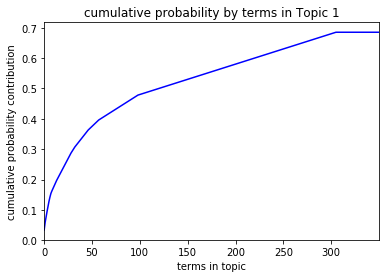

In [666]:
from sklearn.feature_extraction.text import CountVectorizer
import numpy as np

import matplotlib.pyplot as plt
sort_doc=np.sort(topic1_full_list)[::-1]

cum_doc=np.cumsum(sort_doc)
count=len(cum_doc)
list_count= range(count)
#doc_range=np.array(range(doc_freq))

plt.plot(list_count,cum_doc, c='blue')
plt.xticks(np.arange(0,350,50))
plt.xlabel('terms in topic')
plt.ylabel('cumulative probability contribution')
plt.xlim(0,350)
plt.title('cumulative probability by terms in Topic 1')


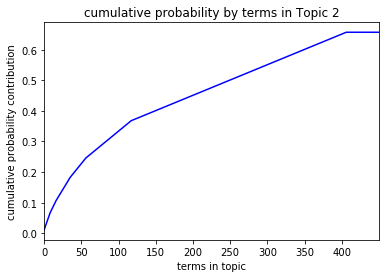

In [664]:
from sklearn.feature_extraction.text import CountVectorizer
import numpy as np

import matplotlib.pyplot as plt
sort_doc=np.sort(topic2_full_list)[::-1]

cum_doc=np.cumsum(sort_doc)
count=len(cum_doc)
list_count= range(count)
#doc_range=np.array(range(cum_doc))

plt.plot(list_count,cum_doc, c='blue')
plt.xticks(np.arange(0,450,50))
plt.xlabel('terms in topic')
plt.ylabel('cumulative probability contribution')
plt.xlim(0,450)
plt.title('cumulative probability by terms in Topic 2')


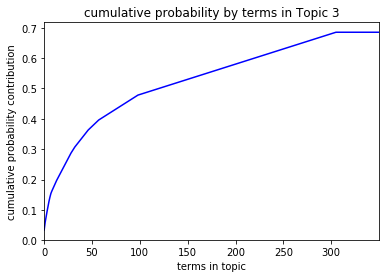

In [665]:
from sklearn.feature_extraction.text import CountVectorizer
import numpy as np

import matplotlib.pyplot as plt
sort_doc=np.sort(topic1_full_list)[::-1]

cum_doc=np.cumsum(sort_doc)
count=len(cum_doc)
list_count= range(count)
#doc_range=np.array(range(doc_freq))

plt.plot(list_count,cum_doc, c='blue')
plt.xticks(np.arange(0,350,50))
plt.xlabel('terms in topic')
plt.ylabel('cumulative probability contribution')
plt.xlim(0,350)
plt.title('cumulative probability by terms in Topic 3')


In the next section, my goal is to use some of the Gensim methods to turn the ldamodel into features I can use in a classification algorithm.

Below I define functions to parse the equations returned by the show_topics() method. The parsing functions identify the patterns in the equation to extract either words or weights.

In [423]:

def parse_words(doc):
    strip_numbers= re.sub("\\d+","",doc)
    strip_pattern1= re.sub("(\\s\\+\\s)(\\.\\*)",",",strip_numbers)
    strip_pattern2= strip_pattern1.replace('"','')
    words=re.sub("^(\\.\\*)","",strip_pattern2)
    return words

In [414]:

def parse_numbers(doc):
    strip_chars= re.sub("[a-zA-Z]","",doc)
    strip_pattern1= re.sub("(\\s\\+\\s)","",strip_chars)
    strip_pattern2= re.sub("(\\*)","",strip_pattern1)
    strip_pattern3=strip_pattern2.replace("'",'')
    numbers= strip_pattern3.replace('""',',')
    return numbers


In [555]:
words1=parse_words(topic_eqs[0][1]).split(',')
probs1=parse_numbers(topic_eqs[0][1]).split(',')[:-1]


In [523]:
words2=parse_words(topic_eqs[1][1]).split(',')
probs2=parse_numbers(topic_eqs[1][1]).split(',')[:-1]

In [448]:
words3=parse_words(topic_eqs[2][1]).split(',')
probs3=parse_numbers(topic_eqs[2][1]).split(',')[:-1]

After parsing, the datatype of items in the list is 'object' so I need to convert numbers to float before using them in any machine learning algorithm.

In [557]:
probs1= [float(i) for i in probs1]
probs2= [float(i) for i in probs2]
probs3= [float(i) for i in probs3]

In [472]:
NOT USED
df1=pd.DataFrame(np.array(probs1).reshape(1,len(probs1)),columns=words1)

df2=pd.DataFrame(np.array(probs2).reshape(1,len(probs2)),columns=words2)

df3=pd.DataFrame(np.array(probs3).reshape(1,len(probs3)),columns=words3)


In [558]:
words_all=[]
words_all.extend(words1)
words_all.extend(words2)
words_all.extend(words3)

300

In [562]:
print('length of probs1:',len(probs1))
print('length of probs2:',len(probs2))
print('length of probs3:',len(probs3))

length of probs1: 100
length of probs2: 100
length of probs3: 100


In [563]:
zeros1=[0]*len(words1)
zeros2=[0]*len(words2)
zeros3=[0]*len(words3)

In [564]:
NOT USED
topic1_wts=[]
topic1_wts.extend(probs1)
topic1_wts.extend(zeros2)
topic1_wts.extend(zeros3)

In [565]:
NOT USED
topic2_wts=[]
topic2_wts.extend(zeros1)
topic2_wts.extend(probs2)
topic2_wts.extend(zeros3)

In [566]:
NOT USED
topic3_wts=[]
topic3_wts.extend(zeros1)
topic3_wts.extend(zeros2)
topic3_wts.extend(probs3)

In [570]:
len(topic3_wts)

300

In [571]:

df1=pd.DataFrame(np.array(topic1_wts).reshape(1,len(words_all)),columns=words_all)

df2=pd.DataFrame(np.array(topic2_wts).reshape(1,len(words_all)),columns=words_all)

df3=pd.DataFrame(np.array(topic3_wts).reshape(1,len(words_all)),columns=words_all)


In [572]:
df1

,fuck,r,soccer,please,post,least,removed,must,old,legend,yellow,contact,action,yes,questions,one,automatically,want,thread,subreddit,performed,jesus,use,bot,message,concerns,compose,automoderator,moderators,question,lmao,wiki,ask,month,read,new,de,account,sport,karma,silva,mbappe,cunt,faq,buffon,link,comment,higuain,rashford,lads,ok,check,vote,sake,information,discussion,create,fellaini,order,assist,manage,boys,self,christ,pathetic,daily,submission,lalas,cross,gifs,confirmed,ah,links,guidelines,submissionguidelines,soccernoobs,clean,david,white,op,navas,posts,sheet,bailly,goat,submit,page,standard,era,giroud,aspas,hahaha,wonderful,guidetti,tony,gomes,disgrace,instead,biased,cringe,like,season,would,get,game,good,one,team,league,really,think,players,play,goal,even,see,time,going,great,well,player,fucking,football,win,shit,united,go,much,still,best,back,next,year,first,last,could,arsenal,club,fans,man,better,know,way,lol,us,real,years,got,right,teams,people,top,goals,also,final,match,playing,chelsea,love,make,always,ball,never,ajax,two,hope,though,city,games,madrid,need,come,already,away,sure,world,say,want,messi,take,big,getting,something,played,lot,every,many,guy,let,look,pretty,liverpool,ever,end,ronaldo,cup,probably,bad,actually,someone,com,https,streamable,www,mirror,u,http,bot,message,reddit,v,possible,leave,watch,youtube,e,holy,feedback,b,imgur,n,vs,subject,pm,compose,erody,comments,creator,c,twittertostreamable,suggestions,de,k,alves,f,twitter,media,van,jpg,p,dani,goal,x,fc,tv,l,gif,replays,g,aa,youtu,pls,videos,w,h,en,source,status,net,celebration,z,atl,hey,header,mp,org,tico,reminds,png,follow,j,crotone,pen,image,upload,stream,co,q,uk,em,content,evra,gfycat,por,forgot,danny,ha,academy,wat,da,singing,wikipedia,lazio,banter,boateng,giphy,reliable,impressed,jack,faz
0,0.034,0.025,0.019,0.017,0.017,0.016,0.014,0.012,0.008,0.007,0.007,0.007,0.007,0.007,0.006,0.006,0.006,0.006,0.006,0.006,0.006,0.006,0.006,0.006,0.006,0.006,0.006,0.006,0.006,0.005,0.005,0.005,0.005,0.004,0.004,0.004,0.004,0.004,0.004,0.004,0.004,0.004,0.004,0.004,0.004,0.004,0.004,0.003,0.003,0.003,0.003,0.003,0.003,0.003,0.003,0.003,0.003,0.003,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.001,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [573]:
df2

,fuck,r,soccer,please,post,least,removed,must,old,legend,yellow,contact,action,yes,questions,one,automatically,want,thread,subreddit,performed,jesus,use,bot,message,concerns,compose,automoderator,moderators,question,lmao,wiki,ask,month,read,new,de,account,sport,karma,silva,mbappe,cunt,faq,buffon,link,comment,higuain,rashford,lads,ok,check,vote,sake,information,discussion,create,fellaini,order,assist,manage,boys,self,christ,pathetic,daily,submission,lalas,cross,gifs,confirmed,ah,links,guidelines,submissionguidelines,soccernoobs,clean,david,white,op,navas,posts,sheet,bailly,goat,submit,page,standard,era,giroud,aspas,hahaha,wonderful,guidetti,tony,gomes,disgrace,instead,biased,cringe,like,season,would,get,game,good,one,team,league,really,think,players,play,goal,even,see,time,going,great,well,player,fucking,football,win,shit,united,go,much,still,best,back,next,year,first,last,could,arsenal,club,fans,man,better,know,way,lol,us,real,years,got,right,teams,people,top,goals,also,final,match,playing,chelsea,love,make,always,ball,never,ajax,two,hope,though,city,games,madrid,need,come,already,away,sure,world,say,want,messi,take,big,getting,something,played,lot,every,many,guy,let,look,pretty,liverpool,ever,end,ronaldo,cup,probably,bad,actually,someone,com,https,streamable,www,mirror,u,http,bot,message,reddit,v,possible,leave,watch,youtube,e,holy,feedback,b,imgur,n,vs,subject,pm,compose,erody,comments,creator,c,twittertostreamable,suggestions,de,k,alves,f,twitter,media,van,jpg,p,dani,goal,x,fc,tv,l,gif,replays,g,aa,youtu,pls,videos,w,h,en,source,status,net,celebration,z,atl,hey,header,mp,org,tico,reminds,png,follow,j,crotone,pen,image,upload,stream,co,q,uk,em,content,evra,gfycat,por,forgot,danny,ha,academy,wat,da,singing,wikipedia,lazio,banter,boateng,giphy,reliable,impressed,jack,faz
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.011,0.008,0.007,0.007,0.007,0.007,0.007,0.007,0.006,0.005,0.005,0.005,0.005,0.005,0.005,0.005,0.005,0.004,0.004,0.004,0.004,0.004,0.004,0.004,0.004,0.004,0.004,0.004,0.004,0.004,0.004,0.004,0.004,0.004,0.004,0.004,0.003,0.003,0.003,0.003,0.003,0.003,0.003,0.003,0.003,0.003,0.003,0.003,0.003,0.003,0.003,0.003,0.003,0.003,0.003,0.003,0.003,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [574]:
df3

,fuck,r,soccer,please,post,least,removed,must,old,legend,yellow,contact,action,yes,questions,one,automatically,want,thread,subreddit,performed,jesus,use,bot,message,concerns,compose,automoderator,moderators,question,lmao,wiki,ask,month,read,new,de,account,sport,karma,silva,mbappe,cunt,faq,buffon,link,comment,higuain,rashford,lads,ok,check,vote,sake,information,discussion,create,fellaini,order,assist,manage,boys,self,christ,pathetic,daily,submission,lalas,cross,gifs,confirmed,ah,links,guidelines,submissionguidelines,soccernoobs,clean,david,white,op,navas,posts,sheet,bailly,goat,submit,page,standard,era,giroud,aspas,hahaha,wonderful,guidetti,tony,gomes,disgrace,instead,biased,cringe,like,season,would,get,game,good,one,team,league,really,think,players,play,goal,even,see,time,going,great,well,player,fucking,football,win,shit,united,go,much,still,best,back,next,year,first,last,could,arsenal,club,fans,man,better,know,way,lol,us,real,years,got,right,teams,people,top,goals,also,final,match,playing,chelsea,love,make,always,ball,never,ajax,two,hope,though,city,games,madrid,need,come,already,away,sure,world,say,want,messi,take,big,getting,something,played,lot,every,many,guy,let,look,pretty,liverpool,ever,end,ronaldo,cup,probably,bad,actually,someone,com,https,streamable,www,mirror,u,http,bot,message,reddit,v,possible,leave,watch,youtube,e,holy,feedback,b,imgur,n,vs,subject,pm,compose,erody,comments,creator,c,twittertostreamable,suggestions,de,k,alves,f,twitter,media,van,jpg,p,dani,goal,x,fc,tv,l,gif,replays,g,aa,youtu,pls,videos,w,h,en,source,status,net,celebration,z,atl,hey,header,mp,org,tico,reminds,png,follow,j,crotone,pen,image,upload,stream,co,q,uk,em,content,evra,gfycat,por,forgot,danny,ha,academy,wat,da,singing,wikipedia,lazio,banter,boateng,giphy,reliable,impressed,jack,faz
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.042,0.036,0.02,0.015,0.012,0.011,0.011,0.01,0.009,0.008,0.008,0.008,0.007,0.007,0.007,0.006,0.006,0.006,0.005,0.005,0.005,0.005,0.005,0.004,0.004,0.004,0.004,0.004,0.004,0.004,0.004,0.004,0.004,0.004,0.004,0.003,0.003,0.003,0.003,0.003,0.003,0.003,0.003,0.003,0.003,0.003,0.003,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.002,0.001,0.001,0.001,0.001,0.001,0.001,0.001,0.001,0.001,0.001,0.001,0.001,0.001,0.001,0.001,0.001,0.001,0.001,0.001,0.001,0.001,0.001,0.001,0.001,0.001,0.001,0.001,0.001,0.001,0.001,0.001,0.001


Merge three dataframes into one and then convert to a sparse matrix.

In [575]:
df_concat = pd.concat([df1, df2,df3], axis=1)

In [576]:
import scipy
scipy.sparse.csr_matrix(df_concat.values)

<1x900 sparse matrix of type '<class 'numpy.float64'>'
	with 300 stored elements in Compressed Sparse Row format>

I want to create new lists for the most likely topics for each document.  First I'll use get_document_topics method from the GenSim library.
This method returns a list.  Then, to find what topic each document belongs to, I'll iterate through the list and select the largest probability and its topic id (0-2 since there are 3 topics).

In [115]:
full_doc_topics = ldamodel.get_document_topics(doc_term_matrix, per_word_topics=True)


In [621]:


max_array=[]
#maxProb= 0
maxTopic= 0
max_probs= []
topic_ids=[]

for doc_topics, word_topics, phi_values in full_doc_topics:
    maxProb= 0
    for sub_array in doc_topics:
        if sub_array[1]>maxProb:
            maxProb= sub_array[1]
            maxTopic= sub_array[0]
            
    max_probs.append(maxProb)
    topic_ids.append(maxTopic)


In [623]:
NOT USED 
topics_cont=[]

counter=0

for i in topic_ids:
    temp=[]
    if i==0:
        temp.extend([i])
        temp.extend(topic1_wts)
    if i==1:
        temp.extend([i])
        temp.extend(topic2_wts)
    if i==2:
        temp.extend([i])
        temp.extend(topic3_wts)
    topics_cont.append(temp)
    counter+1

    

In [676]:
NOT USED
id_cols=['topic_id_tag']
id_cols.extend(words_all)

In [678]:
NOT USED
full_df= pd.DataFrame(topics_cont,columns=(id_cols))

Below I define a loop to combine the result from the previous steps.  For each document, identify the topic with maximum probability, and build an array, inserting the correct probability when a term/word in the topic is matched.

In [823]:

trainTextArray=[]
ctCount=0
for lst in cleanText:
    print(lst)
    myCount=0
    temp=[]
    if topic_ids[ctCount]==0:
        for word in words1:
            if word in lst:
                temp.extend([probs1[myCount]])
            else:
                temp.extend([0])
        temp.extend(zeros2)
        temp.extend(zeros3)
    myCount=myCount+1
    if topic_ids[ctCount]== 1:
        temp.extend(zeros1)
        for word in words2:
            if word in lst:
                temp.extend([probs2[myCount]])
            else:
                temp.extend([0])
        temp.extend(zeros3)
    myCount=myCount+1
    if topic_ids[ctCount]== 2:
        temp.extend(zeros1)
        temp.extend(zeros2)
        for word in words3:
            if word in lst:
                temp.extend([probs3[myCount]])
            else:
                temp.extend([0])
    myCount=myCount+1
    trainTextArray.append(temp)
    ctCount=ctCount+1
    

['classic', 'arsenal']
['carlo', 'sheva']
['playground']
['portsmouth', 'winning', 'title', 'newport', 'going']
['technique']
['removed']
['benitez', 'playing', 'rtg', 'newcastle', 'rn']
['pickford', 'scoreline', 'would', 'talent']
['would', 'dutch', 'ever', 'hire', 'non', 'dutch', 'coach', 'rule']
['tio', 'game', 'cool', 'see', 'live', 'chivas', 'campeones']
['foul', 'pogba', 'sticks', 'leg', 'knows']
['honestly', 'hope', 'stays', 'another', 'season', 'especially', 'last', 'games', 'see', 'really', 'starting', 'understand', 'last', 'game', 'ball', 'back', 'high', 'least', 'twice', 'unselfish', 'dropped', 'back']
['knew', 'indians', 'suck', 'football', 'open', 'store', 'every', 'corner']
['silly', 'question', 'ground', 'named', 'craven', 'cottage']
['tie']
['derisory', 'insulting', 'say', 'http', 'www', 'telegraph', 'co', 'uk', 'sport', 'football', 'teams', 'everton', 'david', 'moyes', 'angers', 'everton', 'derisory', 'insulting', 'bid', 'marouane', 'fellaini', 'leighton', 'baines', 'h

The next step is to do apply these same steps to the test data set.  After that I can see how the model validates. The steps will be: 
1.) Find topics of each document in the test set. 
2.) Loop through the documents and construct an array, inserting the correct probability contribution for each term as it is encountered.
3.) attach feature names, convert to dataframe, or sparse matrix for larger data sets. 

In [836]:
test_bow = [dictionary.doc2bow(doc) for doc in testText]

In [ ]:
test_lda = ldamodel[test_bow]

In [838]:
test_doc_topics = ldamodel.get_document_topics(test_bow, per_word_topics=True)


In [840]:

max_array=[]
#maxProb= 0
maxTopic= 0
test_max_probs= []
test_topic_ids=[]

for doc_topics, word_topics, phi_values in test_doc_topics:
    maxProb= 0
    for sub_array in doc_topics:
        if sub_array[1]>maxProb:
            maxProb= sub_array[1]
            maxTopic= sub_array[0]
            
    test_max_probs.append(maxProb)
    test_topic_ids.append(maxTopic)


In [843]:

testTextArray=[]
ctCount=0
for lst in testText:
    print(lst)
    myCount=0
    temp=[]
    if test_topic_ids[ctCount]==0:
        for word in words1:
            if word in lst:
                temp.extend([probs1[myCount]])
            else:
                temp.extend([0])
        temp.extend(zeros2)
        temp.extend(zeros3)
    myCount=myCount+1
    if test_topic_ids[ctCount]== 1:
        temp.extend(zeros1)
        for word in words2:
            if word in lst:
                temp.extend([probs2[myCount]])
            else:
                temp.extend([0])
        temp.extend(zeros3)
    myCount=myCount+1
    if test_topic_ids[ctCount]== 2:
        temp.extend(zeros1)
        temp.extend(zeros2)
        for word in words3:
            if word in lst:
                temp.extend([probs3[myCount]])
            else:
                temp.extend([0])
    myCount=myCount+1
    testTextArray.append(temp)
    ctCount=ctCount+1


['lets', 'say', 'united', 'wins', 'europa', 'league', 'take', 'th', 'place', 'team', 'spot', 'epl', 'champions', 'league', 'correct']
['extended', 'highlights', 'video', 'match', 'read', 'around', 'looks', 'lot', 'like', 'match', 'lazio', 'semi', 'final']
['oh', 'get', 'fuck', 'man', 'beach']
['reminds', 'lot', 'zlatan', 'physicality', 'skill', 'penchant', 'slightly', 'outrageous', 'edit', 'also', 'goal', 'every', 'compilation', 'ever']
['shame', 'win', 'really', 'like', 'club']
['like', 'scheduled', 'local', 'sides', 'meet']
['favorite', 'photo', 'otamendi', 'http', 'ichef', 'bbci', 'co', 'uk', 'live', 'experience', 'cps', 'cpsprodpb', 'vivo', 'live', 'images', 'bcdc', 'e', 'b', 'fdb', 'f', 'c', 'f', 'eb', 'jpg']
['pogba', 'switched', 'dabbing', 'planking']
['late', 'post', 'thread', 'think', 'something', 'lot', 'people', 'missed', 'july', 'th', 'th', 'anniversary', 'independence', 'day', 'us', 'usa', 'pushing', 'particular', 'wc', 'bid', 'hard', 'reasons', 'sure', 'like', 'country', 

In [845]:
x_test=pd.DataFrame(testTextArray,columns=(words_all))

In [829]:
x_train= pd.DataFrame(trainTextArray,columns=(words_all))

In [679]:
NOT USED
x_train=full_df.drop('topic_id_tag',1)

In [675]:
y_train= train.target
y_test= test.target

In [847]:
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
clf=MultinomialNB()
clf.fit(trainTextArray,y_train)
training_accuracy = clf.score(trainTextArray, y_train)
test_accuracy = clf.score(x_test, y_test)
print(training_accuracy)
print(test_accuracy)

0.644726777936
0.639109851535


In [848]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score


clf = LogisticRegression()
# Fit the model on the trainng data.
clf.fit(x_train, y_train)
# Print the accuracy from the testing data.
print(accuracy_score(clf.predict(x_test), y_test))
print(accuracy_score(clf.predict(x_train), y_train))

0.639109851535
0.644726777936


In [681]:
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
clf=MultinomialNB()
clf.fit(x_train,y_train)
training_accuracy = clf.score(x_train, y_train)
#test_accuracy = clf.score(Xtest, ytest)
print(training_accuracy)
#print(test_accuracy)

0.637955604937


In [2]:
from sklearn import svm, datasets
from sklearn.model_selection import GridSearchCV
iris = datasets.load_iris()
parameters = {'kernel':('linear', 'rbf'), 'C':[1, 10]}
svc = svm.SVC()
clf = GridSearchCV(svc, parameters)
clf.fit(iris.data, iris.target)
                            









sorted(clf.cv_results_.keys())
                            

['mean_fit_time',
 'mean_score_time',
 'mean_test_score',
 'mean_train_score',
 'param_C',
 'param_kernel',
 'params',
 'rank_test_score',
 'split0_test_score',
 'split0_train_score',
 'split1_test_score',
 'split1_train_score',
 'split2_test_score',
 'split2_train_score',
 'std_fit_time',
 'std_score_time',
 'std_test_score',
 'std_train_score']

In [682]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score


clf = LogisticRegression()
# Fit the model on the trainng data.
clf.fit(x_train, y_train)
# Print the accuracy from the testing data.
#print(accuracy_score(clf.predict(Xtestlr), ytestlr))
print(accuracy_score(clf.predict(x_train), y_train))

0.637955604937


Next I'm going to use a function to run through hyper-parameters for a logistic regression.

In [ ]:
def cv_score_search(clf, x, y, score_func=accuracy_score):
    result = 0
    nfold = 5
    for train, test in KFold(nfold).split(x): # split data into train/test groups, 5 times
        clf.fit(x[train], y[train]) # fit
        #result += score_func(clf.fit(x[train],y[train]))
        result += score_func(clf.predict(x[test]), y[test]) # evaluate score function on held-out data
    return result / nfold # average


#the grid of parameters to search over

Cs = [0.001, 0.1, 1, 10, 100]
def do_over (Cs):
    for prm in Cs:
        print('Training logReg with C parameter:', prm)
        clf= LogisticRegression(C=prm)
        score= cv_score_search(clf, Xlr, ylr)
        print(score)
    #return score
do_over(Cs)

I want to identify the topic(with greatest probability) of each document.

To visualize the LDA topics I will use pyLDAvis. 

Based on the initial graphs I reduced the number of topics specified in my LDA model hyper-parameters down to 3.  Thinking of LDA as a method of clustering, 3 topics created very distinct groupings of the topics in the corpus. 

The circles in the left panel are grpah of distance between topics. Circles close together represent similar topics.
Circles further apart represent dissimilar topics.  The size of circles is related to the frequency of topics in the corpus.

In [31]:
import pyLDAvis
import pyLDAvis.gensim

LDAvis_prepared = pyLDAvis.gensim.prepare(ldamodel, doc_term_matrix,dictionary)

In [577]:
pyLDAvis.save_html(LDAvis_prepared,'vis.html')

In [32]:
#4th model
pyLDAvis.display(LDAvis_prepared)

In [314]:
#third model
pyLDAvis.display(LDAvis_prepared)

In [311]:
#second model
pyLDAvis.display(LDAvis_prepared)

In [262]:
#first model
pyLDAvis.display(LDAvis_prepared)

In [288]:
from itertools import chain
lda_corpus=ldamodel[doc_term_matrix]

# Find the threshold, let's set the threshold to be 1/#clusters,
# To prove that the threshold is sane, we average the sum of all probabilities:
scores = list(chain(*[[score for topic_id,score in topic] \
                      for topic in [doc for doc in lda_corpus]]))
threshold = sum(scores)/len(scores)

In [273]:
scores = []
for doc in lda_corpus:
    print(doc)

[(0, 0.084775319416334524), (1, 0.81308420874724263), (2, 0.10214047183642289)]
[(0, 0.050681161221010733), (1, 0.89761554371301466), (2, 0.051703295065974507)]
[(0, 0.067665755946753739), (1, 0.81863879657269667), (2, 0.11369544748054954)]
[(0, 0.067201344218201745), (1, 0.071349542906256502), (2, 0.86144911287554182)]
[(0, 0.084152015762893065), (1, 0.83156469662609866), (2, 0.084283287611008173)]
[(0, 0.56611519901528573), (1, 0.18077532189417309), (2, 0.25310947909054121)]
[(0, 0.76029935310008767), (1, 0.11724352154208413), (2, 0.12245712535782825)]
[(0, 0.82540406740015937), (1, 0.086199154630730301), (2, 0.088396777969110177)]
[(0, 0.82928055407446033), (1, 0.086622039101083695), (2, 0.084097406824456017)]
